# This cat does not exist
__Суммарное количество баллов: 10__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ITMO][ML][MS][HW06] <ФИО>`, где вместо `<ФИО>` указаны фамилия и имя__

Цель этого задания - создать котов, которых не существует. В ходе данного задания вы обучите DCGAN и VAE, которые являются одними из первых генеративных моделей. Для этого задания вам наверняка потребуется GPU с CUDA, поэтому рекомендуется использовать Google Colab.

In [1]:
!nvidia-smi

Tue Jan 25 19:34:38 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   51C    P8    31W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import torch
from torch import nn
from torch.optim import Adam
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np

%matplotlib inline

In [3]:
SEED = 42

random.seed(SEED)
torch.manual_seed(SEED)
np.random.seed(SEED)

In [8]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

def imagewide_average(x):
    return x.mean(dim=(-1, -2))

In [9]:
def visualise(imgs, rows=2):
    imgs = (imgs.transpose(1, 3) + 1) / 2
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [10]:
class CatDataset(Dataset):
    def __init__(self, path_to_dataset="cat_136", size=64):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

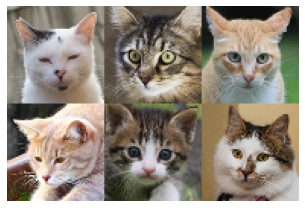

In [11]:
dataset = CatDataset()
visualise(torch.cat([dataset[i].unsqueeze(0) for i in [3, 15, 182, 592, 394, 2941]], dim=0))

In [12]:
dataset[0].shape, len(dataset)

(torch.Size([3, 64, 64]), 5153)

### Задание 1 (2 балла)
Для начала реализуем генератор для нашего DCGAN. Предлагается использовать следующую архитектуру:


Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ConvTranspose2D`, `nn.ReLU`, а также функция `F.interpolate`.

#### Методы
* `__init__` - принимает на вход `start_size`, `latent_channels`, `start_channels` и `upsamplings`. Первые два аргумента отвечают за размер случайного шума, из которого в последствии будет сгенерирована картинка. `start_channels` отвечает за то, сколько каналов должно быть в картинке перед тем, как к ней будут применены upsampling блоки. `upsamplings` - это количество upsampling блоков, которые должны быть применены к картинке. В каждом таком локе количество каналов уменьшается в два раза.


* `forward` - принимает на вход `batch_size`, генерирует `batch_size` картинок из случайного шума.

In [ ]:
class Generator(nn.Module):
    def __init__(self, start_size=2, latent_channels=32, start_channels=1024, upsamplings=6):
        super().__init__()
        self.start_size = start_size
        self.latent_channels = latent_channels

        modules = [nn.Conv2d(latent_channels, start_channels, 1, 1, 0, bias=False)]
        for i in range(upsamplings):
            modules += [
                nn.ConvTranspose2d(start_channels // 2 ** i, start_channels // 2 ** (i + 1), 4, 2, 1, bias=False),
                nn.BatchNorm2d(start_channels // 2 ** (i + 1), affine=False),
                nn.ReLU()
            ]
        modules += [
            nn.Conv2d(start_channels // 2 ** upsamplings, 3, 1, 1, 0),
            nn.Tanh()
        ]
        
        self.generator = nn.Sequential(*modules)

    def forward(self, batch_size: int):
        batch = random_noise(batch_size, self.latent_channels, self.start_size)
        return self.generator(batch)

### Задание 2 (2 балла)
Для начала реализуем дискриминатор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/Disc_DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ReLU` и `nn.Sigmoid`.

#### Методы
* `__init__` - принимает на вход `start_channels` и `downsamplings`. `start_channels` определяет количество каналов, которые должны быть в изображении перед применением downsampling блоков.


* `forward` - принимает на вход `x` - тензор с картинками. Возвращает вектор с размерностью `batch_size`.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, downsamplings=6, start_channels=8):
        super().__init__()

        modules = [nn.Conv2d(3, start_channels, 1, 1, 0)]
        for i in range(downsamplings):
            modules += [
                nn.Conv2d(start_channels * 2 ** i, start_channels * 2 ** (i + 1), 3, 2, 1),
                nn.BatchNorm2d(start_channels * 2 ** (i + 1), affine=False),
                nn.ReLU()  # nn.LeakyReLU(inplace=True)
            ]
        modules += [
            nn.Flatten(),
            nn.Linear(2048, 1),
            nn.Sigmoid()
        ] 
        self.discriminator = nn.Sequential(*modules)

    def forward(self, x):
        return self.discriminator(x)  # torch.Tensor batch_size x 1

In [ ]:
def train_gan(epochs=120, visualise_every=10, batch_size=8):
    generator = Generator()
    discriminator = Discriminator()
    generator.cuda()
    discriminator.cuda()

    gen_optim = Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    disc_optim = Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

    dataset = CatDataset(size=128)

    disc_loss_list = []
    gen_loss_list = []

    for ep in range(1, epochs + 1):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        gen_loss_avg = 0
        disc_loss_avg = 0

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            # Positive update
            batch = batch.cuda()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Negative update
            batch = generator(batch_size).detach()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.zeros_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Generator update
            batch = generator(batch_size)
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            gen_optim.zero_grad()
            loss.backward()
            gen_optim.step()
            gen_loss_avg += loss.item()
            
        if ep % visualise_every == 0:
            with torch.no_grad():
                visualise(generator(6), rows=2)
        
        disc_loss_list.append(disc_loss_avg / total_batches)
        gen_loss_list.append(gen_loss_avg / total_batches)

        print(f"Epoch {ep} | Discriminator loss: {disc_loss_list[-1]} | Generator loss: {gen_loss_list[-1]}")

    return disc_loss_list, gen_loss_list

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 1 | Discriminator loss: 0.2785017962975719 | Generator loss: 4.647330870354398


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 2 | Discriminator loss: 0.49579437403695265 | Generator loss: 3.5769177674321653


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 3 | Discriminator loss: 0.6347456296934075 | Generator loss: 3.237604044794296


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 4 | Discriminator loss: 0.8929872146477889 | Generator loss: 2.266069208890755


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 5 | Discriminator loss: 0.9629576457837908 | Generator loss: 1.9478366110265626


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 6 | Discriminator loss: 0.9469690817894171 | Generator loss: 1.8639791466249442


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 7 | Discriminator loss: 0.882359173342655 | Generator loss: 1.938699892218809


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 8 | Discriminator loss: 0.8942110520781752 | Generator loss: 1.9371138389991678


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 9 | Discriminator loss: 0.8445830975763314 | Generator loss: 2.0006915380865893


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 10 | Discriminator loss: 0.8121097120188859 | Generator loss: 2.0781483152268097


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 11 | Discriminator loss: 0.7533209668631486 | Generator loss: 2.2393575186685006


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 12 | Discriminator loss: 0.7130357838537318 | Generator loss: 2.285269030965633


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 13 | Discriminator loss: 0.7274052511180479 | Generator loss: 2.3452406466377447


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 14 | Discriminator loss: 0.6607056151177468 | Generator loss: 2.4494587262132153


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 15 | Discriminator loss: 0.6462676602461656 | Generator loss: 2.5098988883984017


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 16 | Discriminator loss: 0.5980017866616815 | Generator loss: 2.6528538280392286


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 17 | Discriminator loss: 0.5595827666624675 | Generator loss: 2.8262660422634265


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 18 | Discriminator loss: 0.5275660858316757 | Generator loss: 2.8934264886453285


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 19 | Discriminator loss: 0.5169017621417608 | Generator loss: 2.917052024825019


  0%|          | 0/645 [00:00<?, ?it/s]

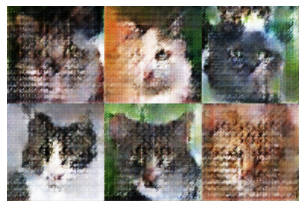

Epoch 20 | Discriminator loss: 0.4894236932490209 | Generator loss: 2.9815099866864103


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 21 | Discriminator loss: 0.47199426635485925 | Generator loss: 3.185828316609682


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 22 | Discriminator loss: 0.4641333373738178 | Generator loss: 3.1202476515162805


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 23 | Discriminator loss: 0.454205674511043 | Generator loss: 3.232882600809847


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 24 | Discriminator loss: 0.4433129257758427 | Generator loss: 3.249908616731626


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 25 | Discriminator loss: 0.41336112027634975 | Generator loss: 3.3188822792368646


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 26 | Discriminator loss: 0.43517302861843365 | Generator loss: 3.4787093956740747


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 27 | Discriminator loss: 0.40905137052860757 | Generator loss: 3.5062234498884366


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 28 | Discriminator loss: 0.411818552864992 | Generator loss: 3.479047612466427


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 29 | Discriminator loss: 0.3647015261296745 | Generator loss: 3.5409527128527625


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 30 | Discriminator loss: 0.36610138103473816 | Generator loss: 3.7046602819091783


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 31 | Discriminator loss: 0.37458377933907294 | Generator loss: 3.6396940008083485


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 32 | Discriminator loss: 0.3513163725859254 | Generator loss: 3.745068679430655


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 33 | Discriminator loss: 0.35864915375583134 | Generator loss: 3.831065100542507


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 34 | Discriminator loss: 0.33381690990205154 | Generator loss: 3.782177787574922


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 35 | Discriminator loss: 0.3602552320217283 | Generator loss: 3.8486470928566057


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 36 | Discriminator loss: 0.34167276674805924 | Generator loss: 3.942054494660093


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 37 | Discriminator loss: 0.35032795705537073 | Generator loss: 3.865403549178787


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 38 | Discriminator loss: 0.3360634414354948 | Generator loss: 4.00480362722037


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 39 | Discriminator loss: 0.33224456395710034 | Generator loss: 3.98603158939329


  0%|          | 0/645 [00:00<?, ?it/s]

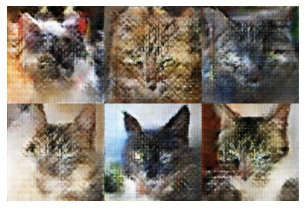

Epoch 40 | Discriminator loss: 0.31022371992116154 | Generator loss: 4.068647533470059


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 41 | Discriminator loss: 0.3358808267629407 | Generator loss: 4.012140327729053


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 42 | Discriminator loss: 0.28423888775766576 | Generator loss: 3.9698528834150073


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 43 | Discriminator loss: 0.3205221416969241 | Generator loss: 4.017997762153608


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 44 | Discriminator loss: 0.2925744369800239 | Generator loss: 4.151314778149313


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 45 | Discriminator loss: 0.31783204120578407 | Generator loss: 4.027017944151107


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 46 | Discriminator loss: 0.28095186152920815 | Generator loss: 4.171318943456093


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 47 | Discriminator loss: 0.2737040090500419 | Generator loss: 4.401295877113846


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 48 | Discriminator loss: 0.2955089303201326 | Generator loss: 4.2383688903003005


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 49 | Discriminator loss: 0.29384364382580347 | Generator loss: 4.271788004670084


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 50 | Discriminator loss: 0.3097447885472507 | Generator loss: 4.180868416145351


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 51 | Discriminator loss: 0.26248449210587926 | Generator loss: 4.17979071497547


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 52 | Discriminator loss: 0.25389699172342545 | Generator loss: 4.361242633058418


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 53 | Discriminator loss: 0.2925647145437279 | Generator loss: 4.5552753039768765


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 54 | Discriminator loss: 0.2697744303387136 | Generator loss: 4.406370724210087


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 55 | Discriminator loss: 0.24457336946187702 | Generator loss: 4.387278389023698


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 56 | Discriminator loss: 0.26354376037901633 | Generator loss: 4.476175058517397


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 57 | Discriminator loss: 0.2385302197731319 | Generator loss: 4.638964756767942


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 58 | Discriminator loss: 0.2529087429142327 | Generator loss: 4.682212245205174


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 59 | Discriminator loss: 0.24813350436984677 | Generator loss: 4.528823557755222


  0%|          | 0/645 [00:00<?, ?it/s]

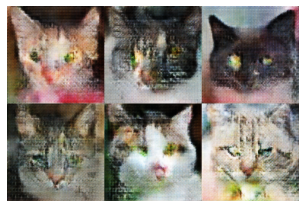

Epoch 60 | Discriminator loss: 0.2614884215510074 | Generator loss: 4.4205554070309825


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 61 | Discriminator loss: 0.23905423556530447 | Generator loss: 4.5652343566928595


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 62 | Discriminator loss: 0.254345458137831 | Generator loss: 4.5275694445145795


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 63 | Discriminator loss: 0.24598310030081824 | Generator loss: 4.626607865604185


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 64 | Discriminator loss: 0.23387689887257415 | Generator loss: 4.537779408767356


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 65 | Discriminator loss: 0.22959070395035147 | Generator loss: 4.803512141432451


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 66 | Discriminator loss: 0.2338266178240964 | Generator loss: 4.754372948815363


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 67 | Discriminator loss: 0.2330610334796751 | Generator loss: 4.580608959801449


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 68 | Discriminator loss: 0.23040420666004466 | Generator loss: 4.64584210385447


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 69 | Discriminator loss: 0.23872054506324997 | Generator loss: 4.714214753105034


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 70 | Discriminator loss: 0.22854413741118615 | Generator loss: 4.781415812902569


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 71 | Discriminator loss: 0.21904802721295638 | Generator loss: 4.69644450789653


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 72 | Discriminator loss: 0.23461768794362606 | Generator loss: 5.011452321726713


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 73 | Discriminator loss: 0.18374855519040778 | Generator loss: 4.857926624624626


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 74 | Discriminator loss: 0.21143395223817685 | Generator loss: 5.035808494002183


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 75 | Discriminator loss: 0.20216939529730055 | Generator loss: 4.939440703262454


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 76 | Discriminator loss: 0.21013788893956767 | Generator loss: 4.889628304180151


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 77 | Discriminator loss: 0.19256612083383956 | Generator loss: 5.098981760303427


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 78 | Discriminator loss: 0.19396629036991275 | Generator loss: 4.948646935987177


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 79 | Discriminator loss: 0.18322091476955643 | Generator loss: 5.269826857384688


  0%|          | 0/645 [00:00<?, ?it/s]

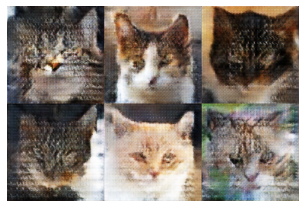

Epoch 80 | Discriminator loss: 0.18397014604739895 | Generator loss: 5.143807213961708


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 81 | Discriminator loss: 0.1614028332324999 | Generator loss: 5.349631029996813


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 82 | Discriminator loss: 0.18849987060531212 | Generator loss: 5.434636060310447


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 83 | Discriminator loss: 0.18805104126375408 | Generator loss: 5.307265144049751


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 84 | Discriminator loss: 0.18760252173232225 | Generator loss: 5.184820849517858


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 85 | Discriminator loss: 0.19578432031755075 | Generator loss: 5.191419797561924


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 86 | Discriminator loss: 0.17779781762224486 | Generator loss: 5.219021336354825


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 87 | Discriminator loss: 0.1710866054085399 | Generator loss: 5.2301798664635015


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 88 | Discriminator loss: 0.16014665739069103 | Generator loss: 5.401186479915003


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 89 | Discriminator loss: 0.16711239311041412 | Generator loss: 5.43079721043754


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 90 | Discriminator loss: 0.18346023256176225 | Generator loss: 5.4157868590414155


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 91 | Discriminator loss: 0.17701758355721767 | Generator loss: 5.497052705621127


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 92 | Discriminator loss: 0.19337780645259559 | Generator loss: 5.364128030327536


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 93 | Discriminator loss: 0.18529720120030518 | Generator loss: 5.407915838386701


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 94 | Discriminator loss: 0.16587315537652195 | Generator loss: 5.4631579559967385


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 95 | Discriminator loss: 0.16793439563274068 | Generator loss: 5.322586224130962


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 96 | Discriminator loss: 0.15131006751697676 | Generator loss: 5.670067487573772


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 97 | Discriminator loss: 0.17244309633879215 | Generator loss: 5.510618355333435


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 98 | Discriminator loss: 0.16159106445887808 | Generator loss: 5.567023977961229


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 99 | Discriminator loss: 0.1570036839829464 | Generator loss: 5.5879582670164405


  0%|          | 0/645 [00:00<?, ?it/s]

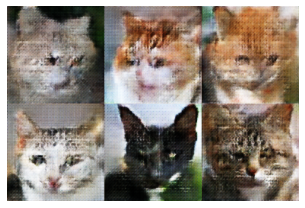

Epoch 100 | Discriminator loss: 0.14586278304761158 | Generator loss: 5.573154459875193


In [ ]:
disc_loss_list, gen_loss_list = train_gan(epochs=100, visualise_every=20, batch_size=8)

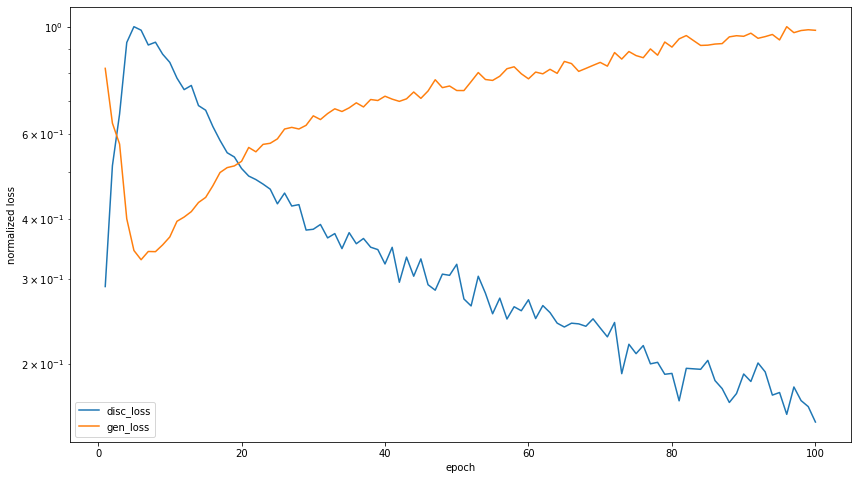

In [ ]:
plt.rcParams["figure.figsize"] = (14, 8)

plt.plot(range(1, len(disc_loss_list) + 1), np.array(disc_loss_list)/max(disc_loss_list), label='disc_loss')
plt.plot(range(1, len(gen_loss_list) + 1), np.array(gen_loss_list)/max(gen_loss_list), label='gen_loss')

plt.xlabel("epoch")
plt.ylabel("normalized loss")
plt.yscale("log")
plt.legend()

plt.show()

### Задание 3 (5 баллов)
Теперь посмотрим на другую модель: Variational Autoencoder. В отличии от GAN, в котором генератор пытается себя обмануть дискриминатор, а дискриминатор старается не быть обманутым, VAE решает задачу реконструкции элемента множества X с применением регуляризации в латентном пространстве. 

Полностью архитектура выглядит так:
![](imgs/VAE.png)

Из нее можно выделить две части: Encoder (по изображению возвращает mu и sigma) и Decoder (по случайному шуму восстанавливает изображение). На высоком уровне VAE можно представить так:

![](imgs/VAE_highlevel.png)

В данном задании вам необходимо реализовать полную архитектуру VAE.

#### Методы
* `__init__` - принимает на вход `img_size`, `downsamplings`, `latent_size`, `linear_hidden_size`, `down_channels` и `up_channels`. `img_size` - размер стороны входного изображения. `downsamplings` - количество downsampling (и upsampling) блоков. `latent_size` - размер латентного пространства, в котором в который будет закодирована картинка. `linear_hidden_size` количество нейронов на скрытом слое полносвязной сети в конце encoder'а. Для полносвязной сети decoder'а это число стоит умножить на 2. `down_channels` - количество каналов, в которое будет преобразовано трехцветное изображение перед применением `downsampling` блоков. `up_channels` - количество каналов, которое должно получиться после применения всех upsampling блоков.

* `forward` - принимает на вход `x`. Считает распределение $N(\mu, \sigma^2)$ и вектор $z \sim N(\mu, \sigma^2)$. Возвращает $x'$ - восстановленную из вектора $z$ картинку и $D_{KL}(N(\mu, \sigma^2), N(0, 1)) = 0.5 \cdot (\sigma^2 + \mu^2 - \log \sigma^2 - 1)$.

* `encode` - принимает на вход `x`. Возвращает вектор из распределения $N(\mu, \sigma^2)$.

* `decode` - принимает на вход `z`. Возвращает восстановленную по вектору картинку.


#### Если хочется улучшить качество
https://arxiv.org/pdf/1906.00446.pdf

In [13]:
class Encoder(nn.Module):
    def __init__(self, downsamplings, latent_size, down_channels):
        super().__init__()
        self.latent_size = latent_size

        modules = [nn.Conv2d(3, down_channels, 1, 1, 0)]
        for i in range(downsamplings):
            modules += [
                nn.Conv2d(down_channels * 2 ** i,
                          down_channels * 2 ** (i + 1),
                          3, 2, 1),
                nn.BatchNorm2d(down_channels * 2 ** (i + 1), affine=False),
                nn.ReLU()
            ]

        modules += [
            nn.Conv2d(down_channels * 2 ** (downsamplings), 2 * latent_size, 1, 1, 0),
            nn.Flatten()
        ]
        self.encoder = nn.Sequential(*modules)

    def forward(self, batch):
        encoded = self.encoder(batch)
        mu, log_sigma = torch.split(encoded, self.latent_size, dim=1)
        return mu, log_sigma


class Decoder(nn.Module):
    def __init__(self, upsamplings, latent_size, up_channels):
        super().__init__()
        start_channels = up_channels * 2 ** upsamplings
        modules = [nn.Conv2d(latent_size, start_channels, 1, 1, 0)]
        for i in range(upsamplings):
            modules += [
                nn.ConvTranspose2d(start_channels // 2 ** i, start_channels // 2 ** (i + 1), 4, 2, 1),
                nn.BatchNorm2d(start_channels // 2 ** (i + 1), affine=False),
                nn.ReLU()  # nn.LeakyReLU()
            ]

        modules += [
            nn.Conv2d(up_channels, 3, 1, 1, 0),
            nn.Tanh()
        ]
        self.decoder = nn.Sequential(*modules)

    def forward(self, embeddings):
        embeddings = embeddings.reshape(*embeddings.shape, 1, 1)
        return self.decoder(embeddings)

In [14]:
class VAE(nn.Module):
    def __init__(self, img_size=128, downsamplings=7, latent_size=512,
                 linear_hidden_size=1024, down_channels=8, up_channels=16):
        super().__init__()
        self.encoder = Encoder(downsamplings, latent_size, down_channels)
        self.decoder = Decoder(downsamplings, latent_size, up_channels)
        # print(self.decoder)

    def forward(self, x):
        mu, loq_sigma = self.encoder(x)
        sigma = torch.exp(loq_sigma)
        kld = 0.5 * (sigma + torch.square(mu) - loq_sigma - 1)
        z = mu + torch.randn_like(sigma) * sigma
        x_pred = self.decoder(z)
        return x_pred, kld

    def encode(self, x):
        mu, loq_sigma = self.encoder(x)
        sigma = torch.exp(loq_sigma)
        z = mu + torch.randn_like(sigma) * sigma
        return z

    def decode(self, z):
        return self.decoder(z)

In [15]:
def train_vae(epochs=200, batch_size=8, visualise_every=10):
    vae = VAE()
    vae.cuda()
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    rec_loss_list = []
    kld_loss_list = []

    for ep in range(1, epochs + 1):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if ep % visualise_every == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()
        
        rec_loss_list.append(rec_loss_avg / total_batches)
        kld_loss_list.append(kld_loss_avg / total_batches)
        print(f"Epoch {ep} | Reconstruction loss: {rec_loss_list[-1]} | KLD loss: {kld_loss_list[-1]}")
    return np.array(rec_loss_list), np.array(kld_loss_list)

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 1 | Reconstruction loss: 15746.332592773437 | KLD loss: 544.4622273445129


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 2 | Reconstruction loss: 14213.622143554687 | KLD loss: 8660.3723072052


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 3 | Reconstruction loss: 13499.199877929688 | KLD loss: 138.63399353027344


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 4 | Reconstruction loss: 13180.410693359376 | KLD loss: 117.97736415863037


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 5 | Reconstruction loss: 12988.597534179688 | KLD loss: 155.17549571990966


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 6 | Reconstruction loss: 12105.04375 | KLD loss: 126.58793296813965


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 7 | Reconstruction loss: 10365.50791015625 | KLD loss: 166.14235076904296


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 8 | Reconstruction loss: 8854.407202148437 | KLD loss: 214.85647048950196


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 9 | Reconstruction loss: 7977.951611328125 | KLD loss: 253.641357421875


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 10 | Reconstruction loss: 7446.210180664062 | KLD loss: 271.8995086669922


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 11 | Reconstruction loss: 7002.591870117188 | KLD loss: 279.7690032958984


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 12 | Reconstruction loss: 6673.596630859375 | KLD loss: 288.93805465698244


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 13 | Reconstruction loss: 6317.856958007813 | KLD loss: 304.096501159668


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 14 | Reconstruction loss: 6090.487731933594 | KLD loss: 321.38547439575194


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 15 | Reconstruction loss: 5916.64990234375 | KLD loss: 334.6738105773926


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 16 | Reconstruction loss: 5784.638366699219 | KLD loss: 344.5293281555176


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 17 | Reconstruction loss: 5639.707250976562 | KLD loss: 349.6072036743164


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 18 | Reconstruction loss: 5514.647204589844 | KLD loss: 355.13093795776365


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 19 | Reconstruction loss: 5406.8310546875 | KLD loss: 362.3280395507812


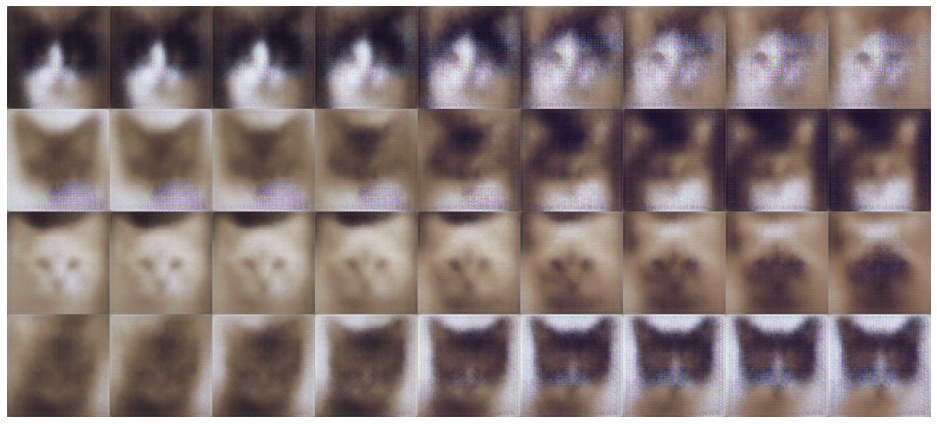

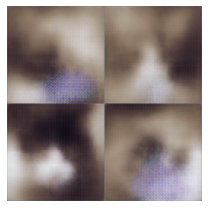

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 20 | Reconstruction loss: 5318.023620605469 | KLD loss: 368.5684417724609


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 21 | Reconstruction loss: 5177.711608886719 | KLD loss: 376.23433685302734


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 22 | Reconstruction loss: 5069.125744628906 | KLD loss: 383.01996154785155


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 23 | Reconstruction loss: 4994.719091796875 | KLD loss: 389.4744186401367


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 24 | Reconstruction loss: 4881.810729980469 | KLD loss: 396.0967712402344


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 25 | Reconstruction loss: 4744.650317382812 | KLD loss: 404.06779861450195


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 26 | Reconstruction loss: 4656.949621582031 | KLD loss: 415.306143951416


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 27 | Reconstruction loss: 4538.122021484375 | KLD loss: 423.15039291381834


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 28 | Reconstruction loss: 4453.347607421875 | KLD loss: 429.7772331237793


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 29 | Reconstruction loss: 4363.613342285156 | KLD loss: 435.76448822021484


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 30 | Reconstruction loss: 4273.0870910644535 | KLD loss: 441.36655349731444


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 31 | Reconstruction loss: 4217.590502929687 | KLD loss: 446.45123825073244


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 32 | Reconstruction loss: 4131.840466308594 | KLD loss: 451.9483070373535


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 33 | Reconstruction loss: 4089.150915527344 | KLD loss: 457.5561164855957


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 34 | Reconstruction loss: 4004.2416381835938 | KLD loss: 461.5367942810059


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 35 | Reconstruction loss: 3966.235980224609 | KLD loss: 465.96580963134767


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 36 | Reconstruction loss: 3903.2780334472654 | KLD loss: 470.25409545898435


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 37 | Reconstruction loss: 3877.2276611328125 | KLD loss: 473.9383827209473


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 38 | Reconstruction loss: 3817.117810058594 | KLD loss: 478.73009796142577


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 39 | Reconstruction loss: 3759.9973999023437 | KLD loss: 482.8732536315918


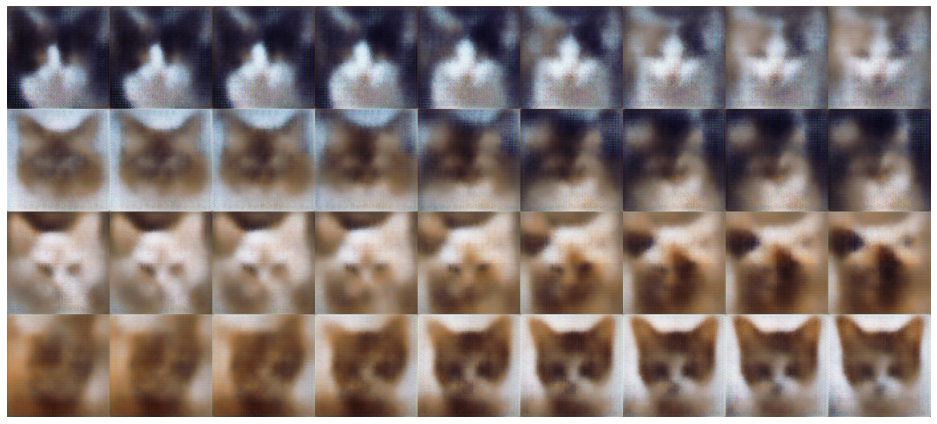

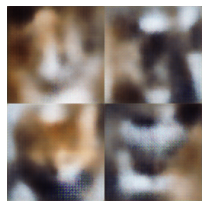

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 40 | Reconstruction loss: 3716.5624450683595 | KLD loss: 486.1744667053223


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 41 | Reconstruction loss: 3661.56689453125 | KLD loss: 489.6489990234375


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 42 | Reconstruction loss: 3609.9349670410156 | KLD loss: 493.60152130126954


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 43 | Reconstruction loss: 3595.357702636719 | KLD loss: 496.16323165893556


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 44 | Reconstruction loss: 3583.1125366210936 | KLD loss: 499.143514251709


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 45 | Reconstruction loss: 3527.515460205078 | KLD loss: 501.15869064331054


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 46 | Reconstruction loss: 3507.8742797851564 | KLD loss: 502.9605369567871


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 47 | Reconstruction loss: 3449.511090087891 | KLD loss: 505.52245864868166


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 48 | Reconstruction loss: 3408.6096130371093 | KLD loss: 508.6706672668457


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 49 | Reconstruction loss: 3380.979211425781 | KLD loss: 510.45657806396486


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 50 | Reconstruction loss: 3362.8983764648438 | KLD loss: 512.749658203125


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 51 | Reconstruction loss: 3334.101171875 | KLD loss: 514.9966705322265


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 52 | Reconstruction loss: 3340.446405029297 | KLD loss: 516.0306953430176


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 53 | Reconstruction loss: 3288.1078186035156 | KLD loss: 517.4735168457031


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 54 | Reconstruction loss: 3243.799206542969 | KLD loss: 519.5862365722656


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 55 | Reconstruction loss: 3229.564099121094 | KLD loss: 520.437744140625


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 56 | Reconstruction loss: 3211.0173950195312 | KLD loss: 521.6357116699219


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 57 | Reconstruction loss: 3180.0939758300783 | KLD loss: 522.815640258789


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 58 | Reconstruction loss: 3147.0795715332033 | KLD loss: 524.0887802124023


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 59 | Reconstruction loss: 3120.030615234375 | KLD loss: 525.4752853393554


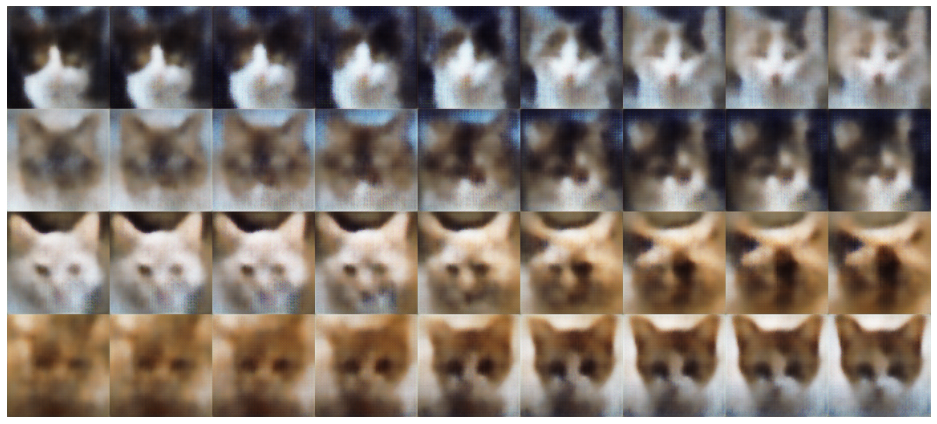

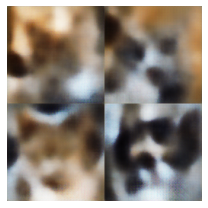

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 60 | Reconstruction loss: 3130.690704345703 | KLD loss: 526.8430557250977


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 61 | Reconstruction loss: 3093.2987548828123 | KLD loss: 528.4805877685546


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 62 | Reconstruction loss: 3070.8036560058595 | KLD loss: 528.7218536376953


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 63 | Reconstruction loss: 3069.4129150390627 | KLD loss: 529.7007110595703


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 64 | Reconstruction loss: 3025.963104248047 | KLD loss: 531.566293334961


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 65 | Reconstruction loss: 3019.851251220703 | KLD loss: 532.2123718261719


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 66 | Reconstruction loss: 3000.9588989257813 | KLD loss: 533.9151107788086


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 67 | Reconstruction loss: 2998.1921325683593 | KLD loss: 534.998388671875


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 68 | Reconstruction loss: 2977.9667419433595 | KLD loss: 535.6046920776367


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 69 | Reconstruction loss: 2942.360137939453 | KLD loss: 536.5903411865235


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 70 | Reconstruction loss: 2925.570446777344 | KLD loss: 537.4113189697266


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 71 | Reconstruction loss: 2911.2632385253905 | KLD loss: 537.6358810424805


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 72 | Reconstruction loss: 2907.4645812988283 | KLD loss: 538.9889999389649


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 73 | Reconstruction loss: 2866.8673400878906 | KLD loss: 540.3430541992187


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 74 | Reconstruction loss: 2860.00390625 | KLD loss: 540.9183990478516


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 75 | Reconstruction loss: 2853.7303100585937 | KLD loss: 541.4031127929687


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 76 | Reconstruction loss: 2835.9376525878906 | KLD loss: 542.4172088623047


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 77 | Reconstruction loss: 2824.5061279296874 | KLD loss: 542.1019393920899


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 78 | Reconstruction loss: 2825.097528076172 | KLD loss: 543.0889511108398


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 79 | Reconstruction loss: 2798.620635986328 | KLD loss: 544.4497772216797


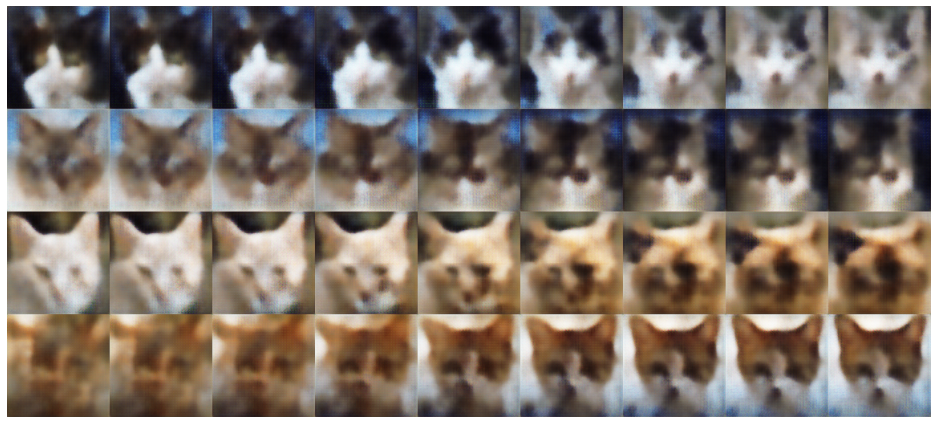

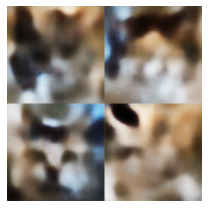

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 80 | Reconstruction loss: 2816.556854248047 | KLD loss: 545.5845077514648


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 81 | Reconstruction loss: 2790.160125732422 | KLD loss: 544.9087677001953


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 82 | Reconstruction loss: 2773.9029541015625 | KLD loss: 546.0352401733398


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 83 | Reconstruction loss: 2764.961083984375 | KLD loss: 546.5848678588867


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 84 | Reconstruction loss: 2743.7675354003904 | KLD loss: 545.0333999633789


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 85 | Reconstruction loss: 2746.469122314453 | KLD loss: 546.6825714111328


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 86 | Reconstruction loss: 2727.909460449219 | KLD loss: 548.3892074584961


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 87 | Reconstruction loss: 2706.6083801269533 | KLD loss: 548.9790725708008


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 88 | Reconstruction loss: 2719.845574951172 | KLD loss: 549.234992980957


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 89 | Reconstruction loss: 2692.9230224609373 | KLD loss: 549.8891418457031


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 90 | Reconstruction loss: 2678.2948303222656 | KLD loss: 549.359782409668


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 91 | Reconstruction loss: 2682.7964477539062 | KLD loss: 549.0900451660157


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 92 | Reconstruction loss: 2667.273651123047 | KLD loss: 548.5187896728515


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 93 | Reconstruction loss: 2656.648809814453 | KLD loss: 550.4201095581054


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 94 | Reconstruction loss: 2641.658306884766 | KLD loss: 550.6590713500976


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 95 | Reconstruction loss: 2650.694512939453 | KLD loss: 550.9663040161133


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 96 | Reconstruction loss: 2640.66083984375 | KLD loss: 551.2934417724609


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 97 | Reconstruction loss: 2632.532666015625 | KLD loss: 551.2799468994141


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 98 | Reconstruction loss: 2604.314349365234 | KLD loss: 552.1778793334961


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 99 | Reconstruction loss: 2608.470837402344 | KLD loss: 553.0697128295899


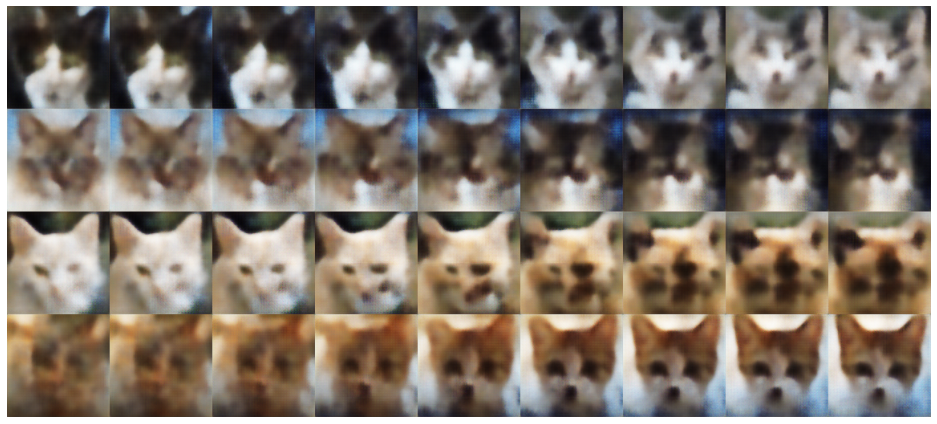

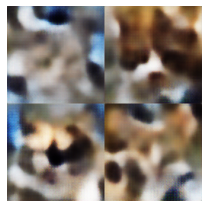

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 100 | Reconstruction loss: 2590.3182067871094 | KLD loss: 552.3553421020508


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 101 | Reconstruction loss: 2587.437921142578 | KLD loss: 552.1420135498047


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 102 | Reconstruction loss: 2573.1319885253906 | KLD loss: 553.7671981811524


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 103 | Reconstruction loss: 2579.616595458984 | KLD loss: 555.7986465454102


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 104 | Reconstruction loss: 2563.974890136719 | KLD loss: 554.6961196899414


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 105 | Reconstruction loss: 2558.254559326172 | KLD loss: 554.9348876953125


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 106 | Reconstruction loss: 2543.744024658203 | KLD loss: 553.6502670288086


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 107 | Reconstruction loss: 2546.507159423828 | KLD loss: 555.4368743896484


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 108 | Reconstruction loss: 2529.075 | KLD loss: 557.0720901489258


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 109 | Reconstruction loss: 2529.0197937011717 | KLD loss: 556.525764465332


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 110 | Reconstruction loss: 2537.3994262695314 | KLD loss: 556.4978790283203


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 111 | Reconstruction loss: 2516.3208557128905 | KLD loss: 556.1846389770508


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 112 | Reconstruction loss: 2502.1409606933594 | KLD loss: 555.3723892211914


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 113 | Reconstruction loss: 2496.270544433594 | KLD loss: 557.2504043579102


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 114 | Reconstruction loss: 2493.970867919922 | KLD loss: 557.7850631713867


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 115 | Reconstruction loss: 2478.2313903808595 | KLD loss: 558.057241821289


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 116 | Reconstruction loss: 2487.6224853515623 | KLD loss: 558.24267578125


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 117 | Reconstruction loss: 2468.7162109375 | KLD loss: 556.9500183105469


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 118 | Reconstruction loss: 2477.5791442871096 | KLD loss: 557.2674835205078


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 119 | Reconstruction loss: 2473.4059509277345 | KLD loss: 557.5618026733398


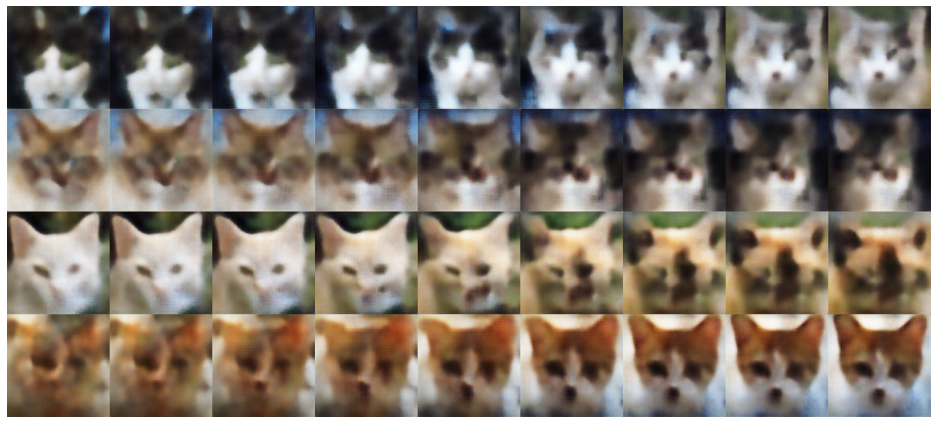

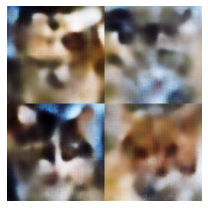

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 120 | Reconstruction loss: 2458.084606933594 | KLD loss: 558.4320098876954


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 121 | Reconstruction loss: 2427.1487243652346 | KLD loss: 558.8411346435547


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 122 | Reconstruction loss: 2431.3606689453127 | KLD loss: 558.4652481079102


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 123 | Reconstruction loss: 2429.9664978027345 | KLD loss: 558.039584350586


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 124 | Reconstruction loss: 2427.4620056152344 | KLD loss: 557.8119338989258


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 125 | Reconstruction loss: 2418.3539489746095 | KLD loss: 558.3166915893555


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 126 | Reconstruction loss: 2409.857501220703 | KLD loss: 559.2089569091797


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 127 | Reconstruction loss: 2419.963946533203 | KLD loss: 559.8356353759766


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 128 | Reconstruction loss: 2401.1264465332033 | KLD loss: 561.102946472168


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 129 | Reconstruction loss: 2404.7294799804686 | KLD loss: 560.2210479736328


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 130 | Reconstruction loss: 2391.7287353515626 | KLD loss: 560.6020553588867


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 131 | Reconstruction loss: 2387.549920654297 | KLD loss: 561.069692993164


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 132 | Reconstruction loss: 2383.34228515625 | KLD loss: 560.4718536376953


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 133 | Reconstruction loss: 2366.396142578125 | KLD loss: 560.9358901977539


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 134 | Reconstruction loss: 2378.215789794922 | KLD loss: 563.137484741211


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 135 | Reconstruction loss: 2366.681591796875 | KLD loss: 562.9033798217773


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 136 | Reconstruction loss: 2354.997204589844 | KLD loss: 560.9756851196289


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 137 | Reconstruction loss: 2348.437127685547 | KLD loss: 562.0834945678711


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 138 | Reconstruction loss: 2348.7932556152346 | KLD loss: 562.8611511230469


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 139 | Reconstruction loss: 2339.8366577148436 | KLD loss: 563.4567230224609


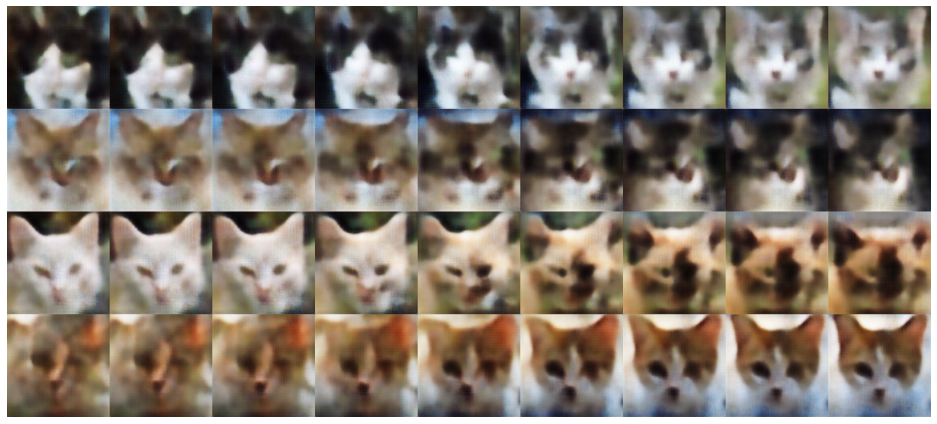

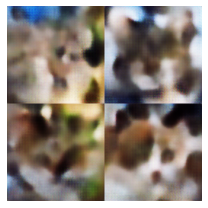

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 140 | Reconstruction loss: 2329.787176513672 | KLD loss: 563.1793853759766


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 141 | Reconstruction loss: 2319.0405151367186 | KLD loss: 563.39462890625


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 142 | Reconstruction loss: 2329.743786621094 | KLD loss: 563.7654357910156


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 143 | Reconstruction loss: 2318.5203369140627 | KLD loss: 564.2426025390625


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 144 | Reconstruction loss: 2308.3404907226563 | KLD loss: 564.6651611328125


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 145 | Reconstruction loss: 2341.569226074219 | KLD loss: 564.2611373901367


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 146 | Reconstruction loss: 2319.519921875 | KLD loss: 564.3482543945313


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 147 | Reconstruction loss: 2295.029638671875 | KLD loss: 564.2550491333008


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 148 | Reconstruction loss: 2297.8984619140624 | KLD loss: 563.833642578125


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 149 | Reconstruction loss: 2287.920770263672 | KLD loss: 564.0595123291016


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 150 | Reconstruction loss: 2272.9440734863283 | KLD loss: 565.2497039794922


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 151 | Reconstruction loss: 2275.6868225097655 | KLD loss: 565.1992172241211


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 152 | Reconstruction loss: 2280.3893310546873 | KLD loss: 565.8406921386719


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 153 | Reconstruction loss: 2262.9399078369142 | KLD loss: 566.2612716674805


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 154 | Reconstruction loss: 2268.466143798828 | KLD loss: 565.8110153198243


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 155 | Reconstruction loss: 2263.2264099121094 | KLD loss: 565.5085205078125


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 156 | Reconstruction loss: 2259.1297302246094 | KLD loss: 564.7030227661132


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 157 | Reconstruction loss: 2249.0461486816407 | KLD loss: 565.4172897338867


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 158 | Reconstruction loss: 2247.190319824219 | KLD loss: 565.5569122314453


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 159 | Reconstruction loss: 2258.9430450439454 | KLD loss: 566.2920806884765


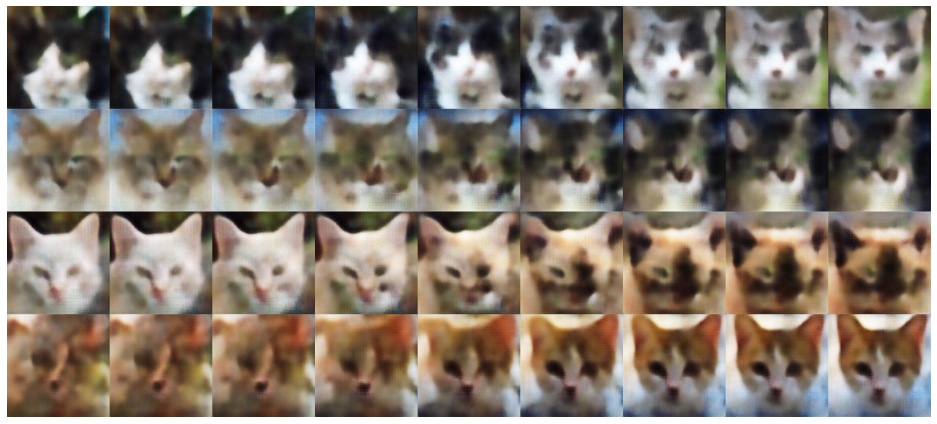

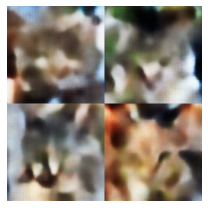

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 160 | Reconstruction loss: 2247.403216552734 | KLD loss: 565.4999618530273


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 161 | Reconstruction loss: 2260.8019104003906 | KLD loss: 565.79560546875


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 162 | Reconstruction loss: 2241.2142181396484 | KLD loss: 567.743424987793


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 163 | Reconstruction loss: 2226.54367980957 | KLD loss: 567.7018936157226


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 164 | Reconstruction loss: 2232.9972412109373 | KLD loss: 566.2347427368164


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 165 | Reconstruction loss: 2226.1314697265625 | KLD loss: 567.4313491821289


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 166 | Reconstruction loss: 2222.376513671875 | KLD loss: 566.9177444458007


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 167 | Reconstruction loss: 2218.0998779296874 | KLD loss: 566.9519638061523


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 168 | Reconstruction loss: 2212.766549682617 | KLD loss: 566.6125747680665


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 169 | Reconstruction loss: 2198.7881744384767 | KLD loss: 566.7801895141602


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 170 | Reconstruction loss: 2195.3931518554687 | KLD loss: 567.4103378295898


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 171 | Reconstruction loss: 2200.90466003418 | KLD loss: 568.3207977294921


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 172 | Reconstruction loss: 2208.295297241211 | KLD loss: 567.9349929809571


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 173 | Reconstruction loss: 2190.718994140625 | KLD loss: 568.2575042724609


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 174 | Reconstruction loss: 2201.2969604492187 | KLD loss: 569.3527694702149


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 175 | Reconstruction loss: 2181.788671875 | KLD loss: 568.1172653198242


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 176 | Reconstruction loss: 2186.7116577148436 | KLD loss: 568.2816543579102


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 177 | Reconstruction loss: 2184.009381103516 | KLD loss: 568.5161178588867


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 178 | Reconstruction loss: 2180.649606323242 | KLD loss: 569.1546752929687


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 179 | Reconstruction loss: 2178.6769470214845 | KLD loss: 569.4790451049805


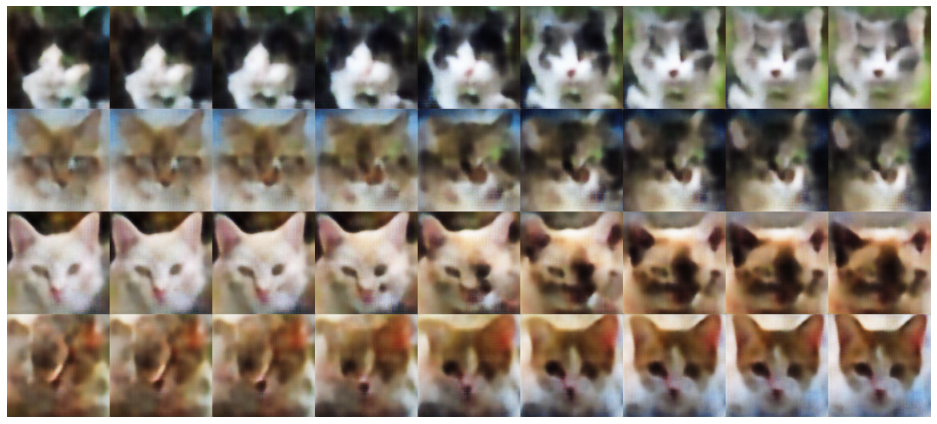

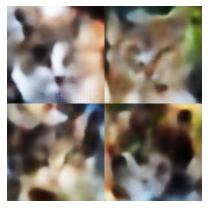

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 180 | Reconstruction loss: 2175.5345123291017 | KLD loss: 567.7453689575195


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 181 | Reconstruction loss: 2163.308673095703 | KLD loss: 568.5052886962891


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 182 | Reconstruction loss: 2174.152032470703 | KLD loss: 569.1046081542969


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 183 | Reconstruction loss: 2172.3554565429686 | KLD loss: 568.786262512207


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 184 | Reconstruction loss: 2179.147348022461 | KLD loss: 568.4835220336914


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 185 | Reconstruction loss: 2155.9308654785154 | KLD loss: 567.0675552368164


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 186 | Reconstruction loss: 2156.8276702880858 | KLD loss: 569.2524215698243


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 187 | Reconstruction loss: 2150.323226928711 | KLD loss: 570.213117980957


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 188 | Reconstruction loss: 2132.484439086914 | KLD loss: 569.7587829589844


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 189 | Reconstruction loss: 2127.617135620117 | KLD loss: 569.6711059570313


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 190 | Reconstruction loss: 2131.700173950195 | KLD loss: 569.9563735961914


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 191 | Reconstruction loss: 2120.6929473876953 | KLD loss: 571.0120559692383


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 192 | Reconstruction loss: 2125.824786376953 | KLD loss: 570.7802185058594


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 193 | Reconstruction loss: 2132.62578125 | KLD loss: 570.4484176635742


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 194 | Reconstruction loss: 2135.259408569336 | KLD loss: 570.6184631347656


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 195 | Reconstruction loss: 2111.374069213867 | KLD loss: 570.4454193115234


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 196 | Reconstruction loss: 2109.540884399414 | KLD loss: 569.6887161254883


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 197 | Reconstruction loss: 2099.0723419189453 | KLD loss: 570.9357223510742


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 198 | Reconstruction loss: 2097.2874908447266 | KLD loss: 570.743539428711


  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 199 | Reconstruction loss: 2114.2568115234376 | KLD loss: 570.5545501708984


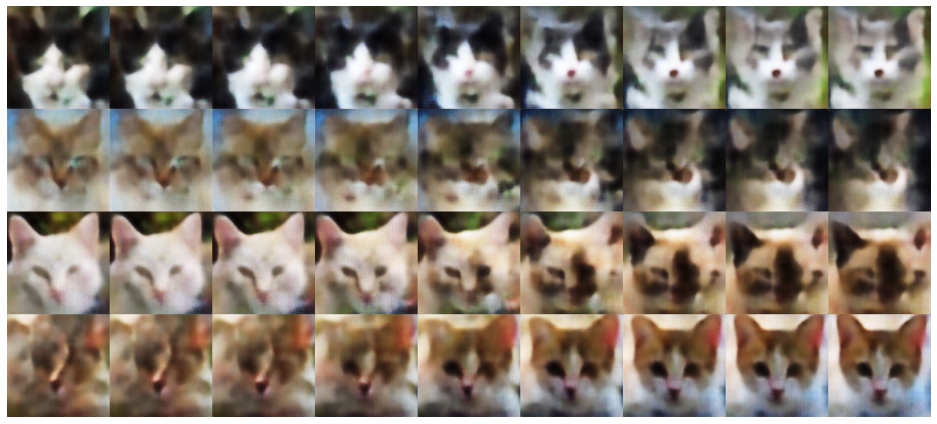

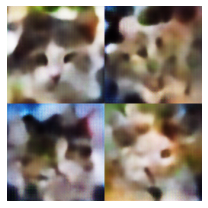

  0%|          | 0/41 [00:00<?, ?it/s]

Epoch 200 | Reconstruction loss: 2097.454965209961 | KLD loss: 570.8918548583985


In [18]:
rec_loss_list, kld_loss_list = train_vae(epochs=200, visualise_every=20, batch_size=128)

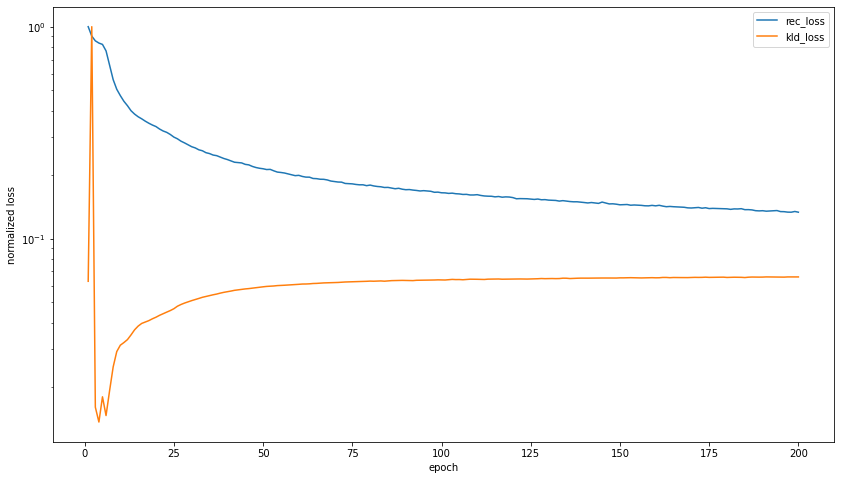

In [19]:
plt.rcParams["figure.figsize"] = (14, 8)

plt.plot(range(1, len(rec_loss_list) + 1), np.array(rec_loss_list)/max(rec_loss_list), label='rec_loss')
plt.plot(range(1, len(kld_loss_list) + 1), np.array(kld_loss_list)/max(kld_loss_list), label='kld_loss')

plt.xlabel("epoch")
plt.ylabel("normalized loss")
plt.yscale("log")
plt.legend()

plt.show()